Here's a helpful map:
https://censusreporter.org/profiles/14000US25025070101-census-tract-70101-suffolk-ma/

read in the real trajectories --> real_trajectories_df

read in the fake trajectories --> fake_trajectories_df


Choose a city from which we're going to select the census tract of interest from

Prune our shapefile to only contain areas around that city:
- choose the cities the cities that we will include in the pruned shapefile
- collect all of the census tracts for each of those cities
- prune our shapefile to only include those census tracts


choose home census tract.

- filter all real trajectories to trajectories with that home census tract --> real_trajectories_for_home_df
- filter all fake trajectories to trajectories with that home census tract --> fake_trajectories_for_home_df




-----

look at a bunch of different census tracts in cambridge
make the maps for the real data
see which home census tracts produce maps that are the most visually interesting
produce trajectories for those home census tracts

In [13]:
import json
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

import os
import sys
module_path = os.path.abspath(os.path.join('../..'))
if module_path not in sys.path:
    sys.path.append(module_path)
from trajectory_transformers import vectors_from_int_vocab



TRACT = 'TRACT'
GEOMETRY = 'geometry'


## Shapefile Pruning


We choose Cambridge as our city from which we select home census tracts of interest.
Cities we choose to include in our pruned shapefile:
    - Arlington
    - Cambridge
    - Belmont
    - Boston 
    - Brookline 
    - Everett  
    - Malden
    - Medford
    - Newton
    - Somerville 
    - Waltham
    - Watertown
   
Here's a map with census tracts from Middlesex County: https://www2.census.gov/geo/maps/dc10map/tract/st25_ma/c25017_middlesex/DC10CT_C25017_005.pdf    

,TRACT,geometry
0,25021418003,POLYGON ((-71.00721256587961 42.23014165019458...
1,25021417701,POLYGON ((-71.00345056634727 42.26050865653624...
2,25021417702,POLYGON ((-70.98695456210277 42.26423765714259...
3,25021418102,POLYGON ((-71.01081056769503 42.24440865265075...
4,25021418004,POLYGON ((-71.00700056748178 42.24409865285512...


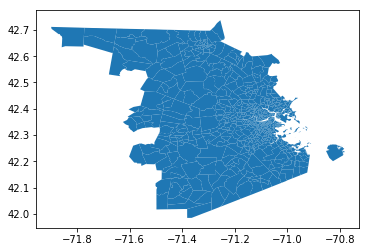

In [14]:
input_tracts_shapefile_filepath = '../../shapefiles/ma/tract_middlesex_norfolk_suffolk.shp'
tracts_shapefile = gpd.read_file(input_tracts_shapefile_filepath).to_crs(epsg=4326)[['GEOID10', GEOMETRY]].rename(columns={'GEOID10': TRACT})

tracts_shapefile.plot()
tracts_shapefile.head()

In [15]:
middlesex_county_prefix = '25017'

arlington_census_tracts = [356100, 356701, 356300, 356702, 356601, 356602, 356400, 356500]
arlington_census_tract_geoids = [middlesex_county_prefix + str(t) for t in arlington_census_tracts]
cambridge_census_tract_geoids = ['25017354900', '25017354800', '25017354700', '25017354600', '25017354500', '25017354400', '25017354300', '25017354200', '25017354100', '25017354000', '25017353900', '25017353800', '25017353700', '25017353600', '25017353500', '25017353400', '25017353300', '25017353200', '25017352102', '25017353102', '25017352101', '25017353000', '25017352900', '25017352800', '25017352700', '25017352600', '25017352500', '25017352400', '25017352300', '25017352200', '25017353101', '25017355000']
belmont_census_tract_geoids = ['25017357100',
 '25017357200',
 '25017357300',
 '25017357400',
 '25017357500',
 '25017357600',
 '25017357700',
 '25017357800']
boston_census_tract_geoids = ['25025010405', '25025010404', '25025010801', '25025010702', '25025010204', '25025010802', '25025010104', '25025000703', '25025000504', '25025000704', '25025010103', '25025000803', '25025980300', '25025120201', '25025120104', '25025110607', '25025000302', '25025000301', '25025140400', '25025140300', '25025140201', '25025140202', '25025140102', '25025130402', '25025130300', '25025130200', '25025130100', '25025120700', '25025120600', '25025120500', '25025120400', '25025110601', '25025110502', '25025110501', '25025110401', '25025101102', '25025101101', '25025101002', '25025101001', '25025100900', '25025100800', '25025100601', '25025100500', '25025100400', '25025100300', '25025981300', '25025981201', '25025990101', '25025981501', '25025981700', '25025981800', '25025100200', '25025100100', '25025092400', '25025092300', '25025092200', '25025092000', '25025091900', '25025091800', '25025091700', '25025091600', '25025981100', '25025140105', '25025980700', '25025120105', '25025120301', '25025071201', '25025091001', '25025091500', '25025091400', '25025091300', '25025091200', '25025091100', '25025090700', '25025090600', '25025090400', '25025090300', '25025090200', '25025980101', '25025040801', '25025010203', '25025110403', '25025110201', '25025981000', '25025090100', '25025082100', '25025082000', '25025081900', '25025081800', '25025081700', '25025081500', '25025081400', '25025081300', '25025110103', '25025110301', '25025140106', '25025010701', '25025010408', '25025000503', '25025081200', '25025081100', '25025080900', '25025080801', '25025080601', '25025080500', '25025080401', '25025080300', '25025071101', '25025070900', '25025140107', '25025130404', '25025130406', '25025120103', '25025100700', '25025100603', '25025092101', '25025061101', '25025070800', '25025070700', '25025070600', '25025070500', '25025070300', '25025070200', '25025070101', '25025061200', '25025061000', '25025060800', '25025060700', '25025080100', '25025060301', '25025090901', '25025060101', '25025981502', '25025060600', '25025060400', '25025060200', '25025051200', '25025050700', '25025050600', '25025050500', '25025050400', '25025050300', '25025050200', '25025040300', '25025040200', '25025030500', '25025981600', '25025051101', '25025051000', '25025030400', '25025030300', '25025030200', '25025030100', '25025020200', '25025010600', '25025010500', '25025010300', '25025000802', '25025000701', '25025050101', '25025050901', '25025060501', '25025981202', '25025040100', '25025040600', '25025000602', '25025000601', '25025000502', '25025000402', '25025000401', '25025000202', '25025000201', '25025040401', '25025020303', '25025070402', '25025020302', '25025020301', '25025020101', '25025081001', '25025010403', '25025000100']
brookline_census_tract_geoids = ['25021400100', '25021400200', '25021400300', '25021400400', '25021400500', '25021400600', '25021400700', '25021400800', '25021400900', '25021401000', '25021401100', '25021401200']
everett_census_tract_geoids = ['25017342101', '25017342102', '25017342201', '25017342202', '25017342300', '25017342400', '25017342500', '25017342600']
malden_census_tract_geoids = ['25017341101',
 '25017341102',
 '25017341200',
 '25017341300',
 '25017341400',
 '25017341500',
 '25017341600',
 '25017341700',
 '25017341800',
 '25017341901',
 '25017341902']
medford_census_tract_geoids = ['25017339100',
 '25017339200',
 '25017339300',
 '25017339400',
 '25017339500',
 '25017339600',
 '25017339700',
 '25017339801',
 '25017339802',
 '25017339900',
 '25017340000',
 '25017340100']
newton_census_tract_geoids = ['25017373100',
 '25017373200',
 '25017373300',
 '25017373400',
 '25017373500',
 '25017373600',
 '25017373700',
 '25017373800',
 '25017373900',
 '25017374000',
 '25017374100',
 '25017374200',
 '25017374300',
 '25017374400',
 '25017374500',
 '25017374600',
 '25017374700',
 '25017374800']
somerville_census_tract_geoids = ['25017350103', '25017350104', '25017350200', '25017350300', '25017350400', '25017350500', '25017350600', '25017350700', '25017350800', '25017350900', '25017351000', '25017351100', '25017351203', '25017351204', '25017351300', '25017351403', '25017351404', '25017351500']
waltham_census_tract_geoids = ['25017368101',
 '25017368102',
 '25017368200',
 '25017368300',
 '25017368400',
 '25017368500',
 '25017368600',
 '25017368700',
 '25017368800',
 '25017368901',
 '25017368902',
 '25017369000',
 '25017369100']
watertown_census_tract_geoids = ['25017370101',
 '25017370102',
 '25017370201',
 '25017370202',
 '25017370300',
 '25017370400']

In [37]:
our_cities_tracts = arlington_census_tract_geoids + \
    cambridge_census_tract_geoids + \
    belmont_census_tract_geoids + \
    boston_census_tract_geoids +\
    brookline_census_tract_geoids+\
    everett_census_tract_geoids+\
    malden_census_tract_geoids+\
    medford_census_tract_geoids+\
    newton_census_tract_geoids+\
    somerville_census_tract_geoids+\
    waltham_census_tract_geoids+\
    watertown_census_tract_geoids

for t in our_cities_tracts:
    assert(len(t) == len(our_cities_tracts[0]))


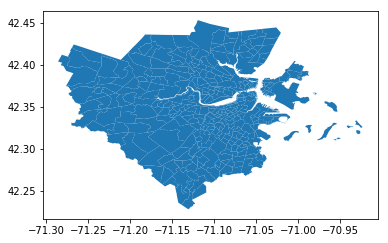

In [17]:
our_cities_tracts_shapefile = tracts_shapefile[tracts_shapefile[TRACT].isin(our_cities_tracts)]
our_cities_tracts_shapefile.plot()

### Plotting trajectory vectors by aggregate dwell time

- Read in the data file with relabeled trajectories. They may be labeled with meaningless integers
- Read in the mapping to re-relabel the trajectories with meaningful geoids.
- Re-relabel the trajectories

- Create mappings from data of {place --> aggregate dwelltime}
- Plot on a map

In [18]:
# Read in the real data
real_relabeled_trajectories_filename = '../data/relabeled_trajectories_1_workweek.txt'
label_to_int_map_filename = '../data/relabeled_trajectories_1_workweek_label_to_int_map.json'

In [19]:
def read_trajectory_vectors(filepath):
    trajectory_vector_list = []
    with open(filepath, 'r') as f:
        for _i, line in enumerate(f):
            line = line.strip()
            line = line.split()
            parse_line = [int(x) for x in line]
            trajectory_vector_list.append(parse_line)
    return trajectory_vector_list


def read_label_to_int_map(filepath):
    label_to_int_map  = None
    with open(label_to_int_map_filename) as json_file:
        label_to_int_map = json.load(json_file)

    label_to_int_map[None] = label_to_int_map['null']
    del label_to_int_map['null']
    return label_to_int_map


In [20]:
def remove_null_homes_data(vectors):
    """There are user trajectory vectors with null valued homes.  Get rid of them.
    Returns vectors list without those vectors.
    """
    filtered_vectors = []
    for vec in vectors:
        home_label = vec[0]
        if (home_label == 0) or (home_label == 'None') or (home_label is None):
            continue
        filtered_vectors.append(vec)
    return filtered_vectors

In [21]:
real_trajectories_int_labels = read_trajectory_vectors(real_relabeled_trajectories_filename)
# Filter out the homeless vectors
real_trajectories_int_labels = remove_null_homes_data(real_trajectories_int_labels)
label_to_int_map = read_label_to_int_map(label_to_int_map_filename)

In [22]:
# Relabel the trajectories
real_trajectories_tract_labels = vectors_from_int_vocab(real_trajectories_int_labels, label_to_int_map)

In [23]:
USERID = 'user id'
HOME = 'home'
WORK = 'work'
GEOID = 'geoid'
DWELLS = 'dwells'

In [63]:
def make_aggregate_dwells_by_users_df(user_trajectory_vectors):
    """
    Takes a list of user trajectory vectors.
    Returns a dataframe with columns: user id, home, work, geoid, dwells
    Where user id is randomly assigned,
        home and work are labels that prefix the trajectory vector
        dwells for a given geoid are aggregated over the number of times it appears in the user trajectory vector.
    """
    data = {
        USERID: [],
        HOME: [],
        WORK: [],
        GEOID: [],
        DWELLS: []
    }
    for uid, user_vector in enumerate(user_trajectory_vectors):
        # We cast all GEOIDs to strings for now so that None is properly handled later
        # But we don't really need this here since we don't map when geoid is None
        home_label = str(user_vector[0])
        work_label = str(user_vector[1])
        # make the {place -> dwells} mapping
        geoid_to_dwells = {}
        for geoid in user_vector[2:]:
            geoid = str(geoid)
            if not geoid in geoid_to_dwells:
                geoid_to_dwells[geoid] = 0
            geoid_to_dwells[geoid] = geoid_to_dwells[geoid] + 1

        for geoid, dwells in geoid_to_dwells.items():
            assert(type(geoid) == str)
            data[USERID].append(uid)
            data[HOME].append(home_label)
            data[WORK].append(work_label)
            data[GEOID].append(geoid)
            data[DWELLS].append(dwells)

    df = pd.DataFrame.from_dict(data)
    return df


In [64]:
real_df = make_aggregate_dwells_by_users_df(real_trajectories_tract_labels)
real_df.sort_values(DWELLS, ascending=False).head()

,user id,home,work,geoid,dwells
116536,20816,25017312501,None,None,118
116372,20773,25025981502,None,None,118
103322,17995,25017374300,None,None,118
6972,1031,25025010600,None,None,118
11557,1717,25017333100,None,None,118


In [27]:
# Make sure our DF is as expected
expected_dwells_per_user = 120
user_ids = real_df[USERID].unique()
for uid in user_ids:
    user_df = real_df[real_df[USERID] == uid]
    assert(user_df[DWELLS].sum() == expected_dwells_per_user)


In [28]:
def geoid_to_user_dwells(df, user_id):
    return df[df[USERID] == user_id]


def geoid_to_aggregate_dwells(df):
    """Aggregates dwells for each geoid over all of the users."""
    geoids = df[GEOID].unique()
    data_dict = {GEOID:[], DWELLS:[]}
    for geoid in geoids:
        dwells = df[df[GEOID] == geoid][DWELLS].sum()
        data_dict[GEOID].append(geoid)
        data_dict[DWELLS].append(dwells)
    return pd.DataFrame.from_dict(data_dict)
    

In [51]:
geoid_to_aggregate_dwells_df = geoid_to_aggregate_dwells(real_df)

In [52]:
print(geoid_to_aggregate_dwells_df.dtypes)
geoid_to_aggregate_dwells_df.sort_values(DWELLS, ascending=False).head()

geoid     object
dwells     int64
dtype: object


,geoid,dwells
2,None,1144311
9,25025070101,20595
35,25025030300,10832
14,25017332400,9751
131,25025060600,8254


In [38]:
def map_dwells(geoid_to_dwells_df, shapefile, title=None, lines=False, kwgs=None):
    # Join the shapefile with the df
    joined_dwell_data_shapefile = shapefile.join(geoid_to_dwells_df.set_index(GEOID), TRACT)
    # There may be places/shapes in shapefile for which there is no corresponding value in the dwells DF.
    # These will be set as Nan. Make them instead 0.
    joined_dwell_data_shapefile.fillna(0, inplace=True)
    # Map it
    fig, ax = plt.subplots(1, figsize=(24, 18))
    kwargs = {
        'column':DWELLS,
        'ax':ax,
        'cmap':'OrRd',
        'scheme':'quantiles',
        'k':100,
        'legend':False,
    }
    if kwgs:
        kwargs.update(kwgs)
    if lines:
        kwargs.update({
            'linewidth':0.2,
            'edgecolor': '#800000'
        })
    joined_dwell_data_shapefile.plot(**kwargs)
    ax.axis('off')
    title = title if title else ''
    ax.set_title(title, fontdict={'fontsize': '15', 'fontweight' : '2'})
    return joined_dwell_data_shapefile

,TRACT,geometry,dwells
458,25025070101,POLYGON ((-71.05043458809909 42.35485467288492...,20595.0
380,25025030300,POLYGON ((-71.04940958760923 42.36405367455924...,10832.0
495,25025060600,POLYGON ((-71.03340458233104 42.35087267283699...,8254.0
395,25025010600,"POLYGON ((-71.0720005944203 42.34903067059343,...",7654.0
209,25017368200,POLYGON ((-71.27386566371833 42.41090967572693...,7085.0


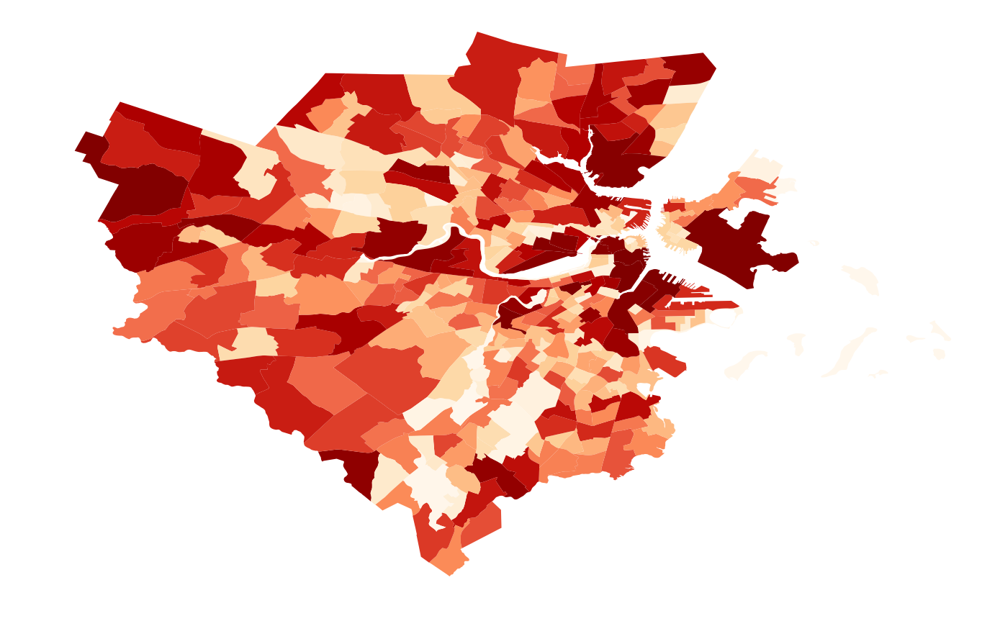

In [39]:
joined_dwell_data_shapefile = map_dwells(geoid_to_aggregate_dwells_df, our_cities_tracts_shapefile)
# joined_dwell_data_shapefile = map_dwells(geoid_to_aggregate_dwells_df, our_cities_tracts_shapefile, lines=True)
joined_dwell_data_shapefile.sort_values(DWELLS, ascending=False).head()

In [33]:
USER_COUNT = 'user count'


def make_homes_to_user_count_df(df, filter_to_home_tracts=None):
    """
    Returns dataframe with columns: home, users
    Where home is a GEOID and users is the number of users with a home there from the original df.
    Optionally filter to given tracts as eligible homes.
    """
    if filter_to_home_tracts:
        df = df[df[HOME].isin(filter_to_home_tracts)]
    data_dict = {HOME:[], USER_COUNT:[]}
    home_geoids = df[HOME].unique()
    for home_geoid in home_geoids:
        data_dict[HOME].append(home_geoid)
        users_count = df[df[HOME] == home_geoid][USERID].nunique()
        data_dict[USER_COUNT].append(users_count)
    return pd.DataFrame.from_dict(data_dict)
    

In [34]:
cambridge_home_tracts_users_count = make_homes_to_user_count_df(real_df, filter_to_home_tracts=cambridge_census_tract_geoids)
cambridge_home_tracts_users_count.sort_values(USER_COUNT, ascending=False).head()

,home,user count
2,25017354900,55
3,25017353102,44
4,25017352300,42
6,25017352400,37
1,25017353101,34


### Map the user specific and aggregate dwell data for chosen census tracts.

- We looked at all of the tracts to choose the most interesting ones to map.
- We could not commit notebook with all of them because the images within the notebook are too large for github to handle.
- So we chose the most interesting tracts and committed the notebook with just those.

In [ ]:
census_tracts = ['25017354900', '25017354800', '25017354500'] # cambridge_census_tract_geoids

Make the maps for the real user dwell data.

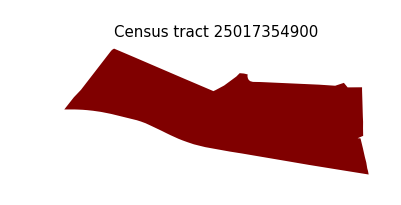

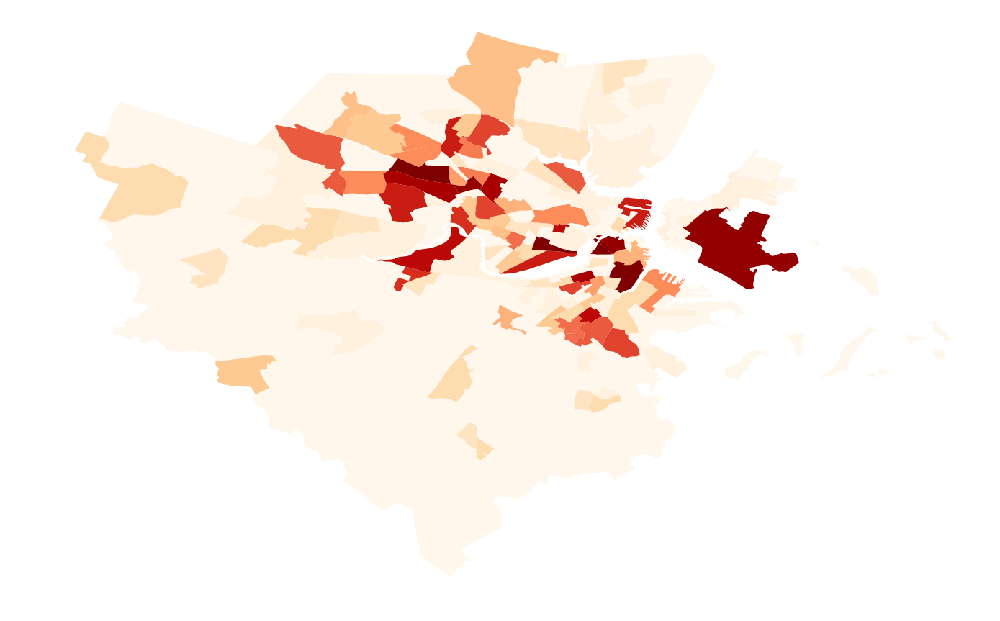

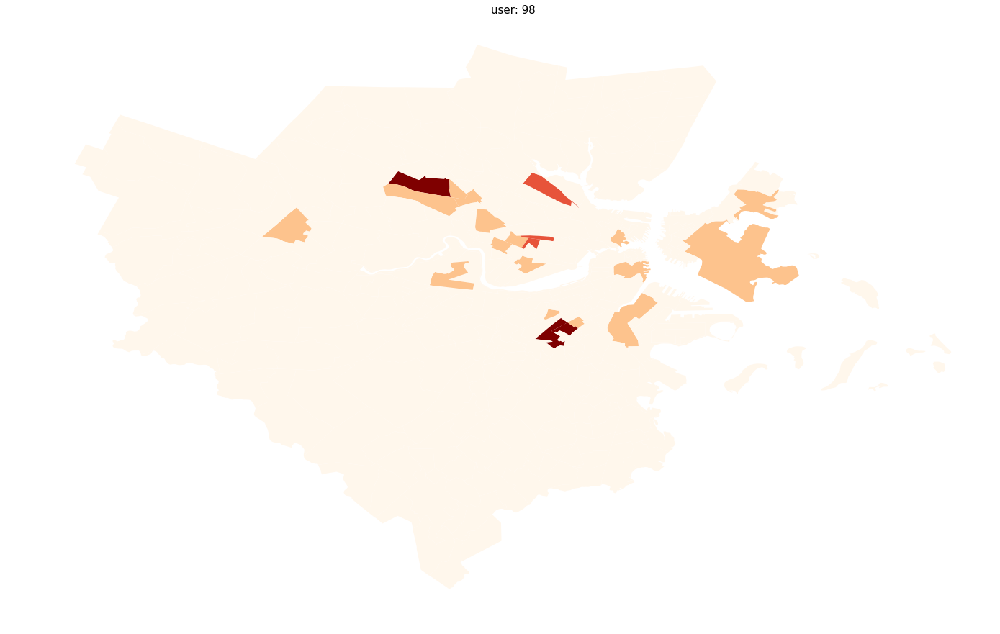

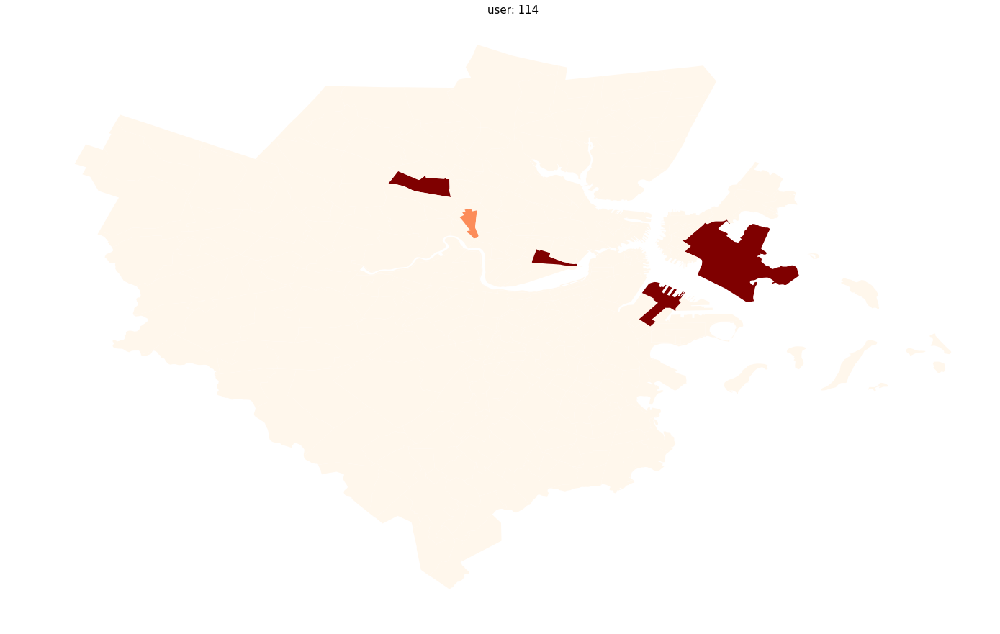

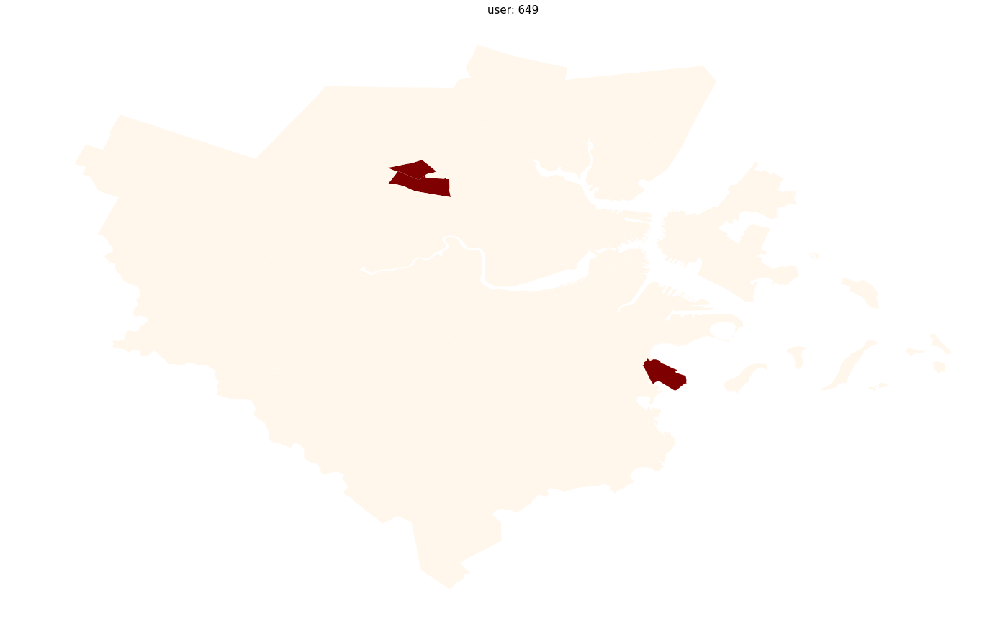

...

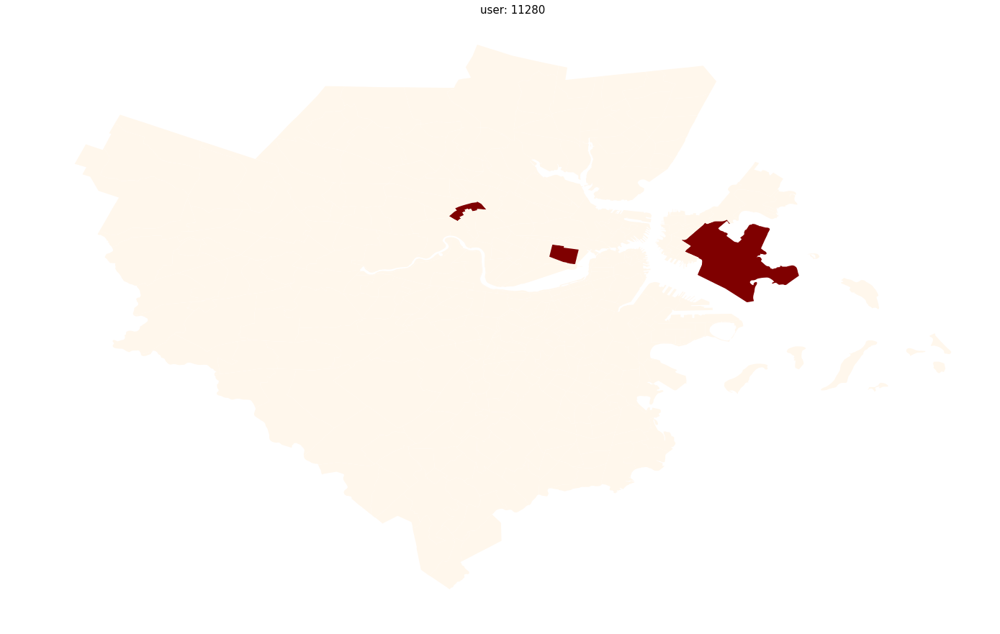

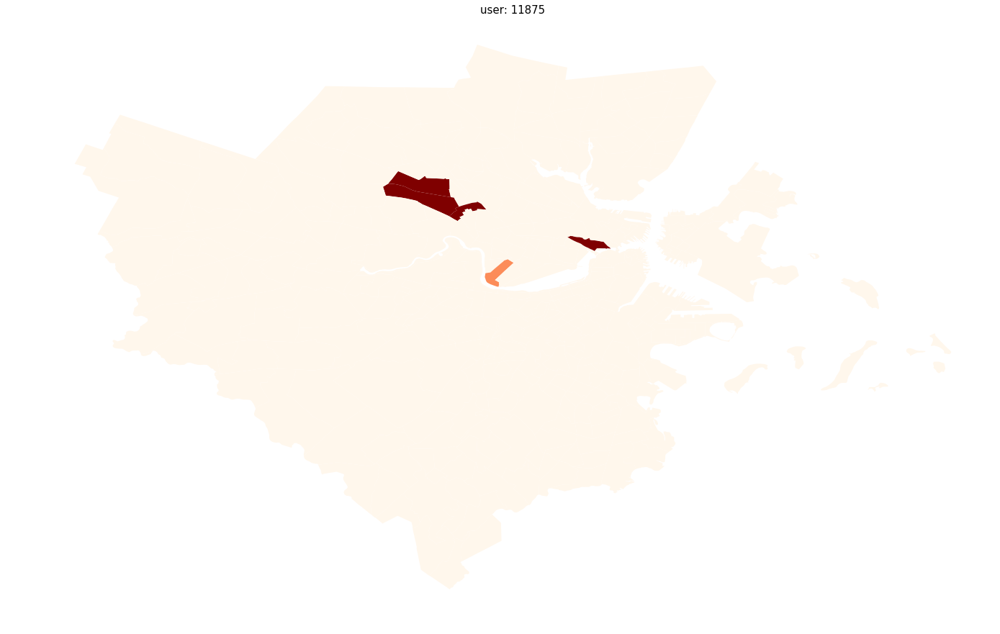

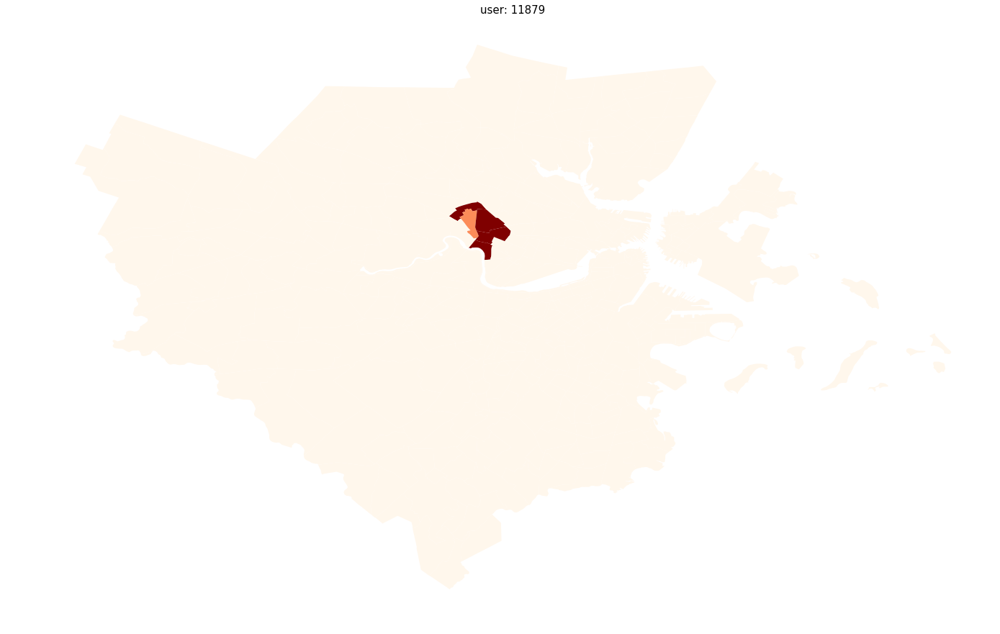

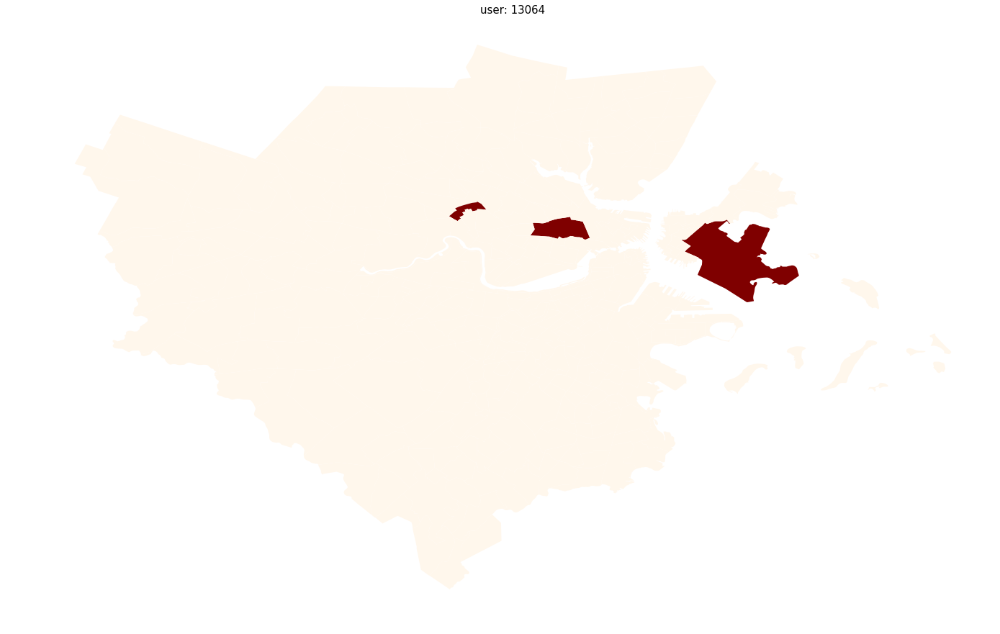

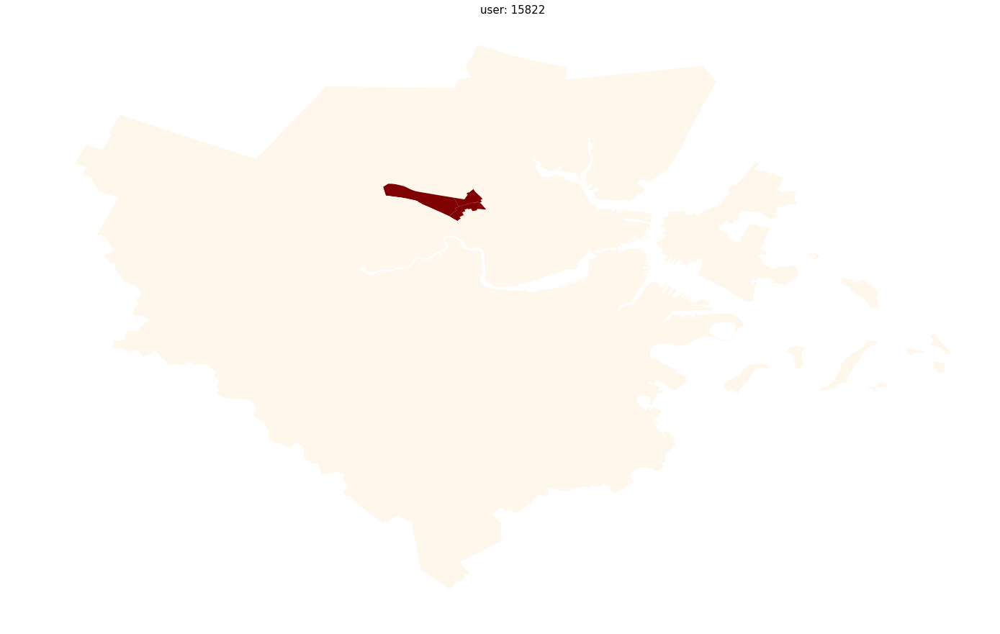

In [85]:
for geoid in census_tracts:
    info = '\nCensus tract %s' % geoid
    tract_shape = our_cities_tracts_shapefile.set_index(TRACT).loc[[geoid]]
    ax = tract_shape.plot(color='#800000')
    plt.title(info, fontdict={'fontsize': '15', 'fontweight' : '2'})
    ax.axis('off')
    # take just the portion of the df for users with homes in this tract
    tract_df = real_df[real_df[HOME] == geoid]
    # make aggregate map
    aggregated_dwells_df = geoid_to_aggregate_dwells(tract_df)
    joined_dwell_data_shapefile_for_tract = map_dwells(aggregated_dwells_df, our_cities_tracts_shapefile)
    # make a map for each user
    user_ids = tract_df[USERID].unique()
    for user_id in user_ids[:12]:
        user_df = geoid_to_user_dwells(tract_df, user_id)
        map_dwells(user_df, our_cities_tracts_shapefile, title='user: %s'%user_id)


Make the maps for the fake user dwell data.

We generated fake data to represent each of the cambridge residents in our fake data.

In [65]:
# Read in the fake data
cambridge_fake_relabeled_trajectories_filename = '../textgenrnn_generator/output/generated_trajectories_1_week_cambridge.txt'
fake_trajectories_int_labels = read_trajectory_vectors(cambridge_fake_relabeled_trajectories_filename)
# Filter out the homeless vectors
fake_trajectories_int_labels = remove_null_homes_data(fake_trajectories_int_labels)
# Relabel the trajectories
fake_trajectories_tract_labels = vectors_from_int_vocab(fake_trajectories_int_labels, label_to_int_map)

In [73]:
fake_df = make_aggregate_dwells_by_users_df(fake_trajectories_tract_labels)
fake_df.sort_values(DWELLS, ascending=False).head()

,user id,home,work,geoid,dwells
1190,181,25017353900,25017353900,25017353900,120
1473,230,25017353600,25017353600,25017353600,120
924,136,25017354300,25017354300,25017354300,120
2174,344,25017353102,25017353102,25017353102,120
1198,184,25017353900,25017353900,25017353900,120


In [78]:
# Make sure our DF is as expected
expected_dwells_per_user = 120
for uid in fake_df[USERID].unique():
    assert(fake_df[fake_df[USERID] == uid][DWELLS].sum() == expected_dwells_per_user)

In [79]:
fake_geoid_to_aggregate_dwells_df = geoid_to_aggregate_dwells(fake_df)
fake_geoid_to_aggregate_dwells_df.sort_values(DWELLS, ascending=False).head(3)

,geoid,dwells
0,None,30483
3,25017353102,4488
1,25017354900,2434


In [80]:
# Due to how the fake trajectories were generated, there should be matching numbers of real and
# fake users for each census tract.
fake_cambridge_home_tracts_users_count = make_homes_to_user_count_df(fake_df, filter_to_home_tracts=cambridge_census_tract_geoids)
fake_cambridge_home_tracts_users_count.sort_values(USER_COUNT, ascending=False).head()

,home,user count
0,25017354900,55
19,25017353102,44
28,25017352300,42
27,25017352400,37
30,25017353101,34


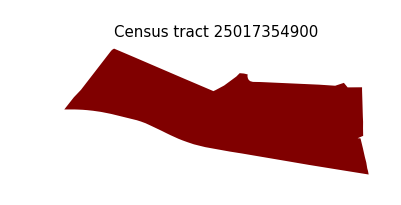

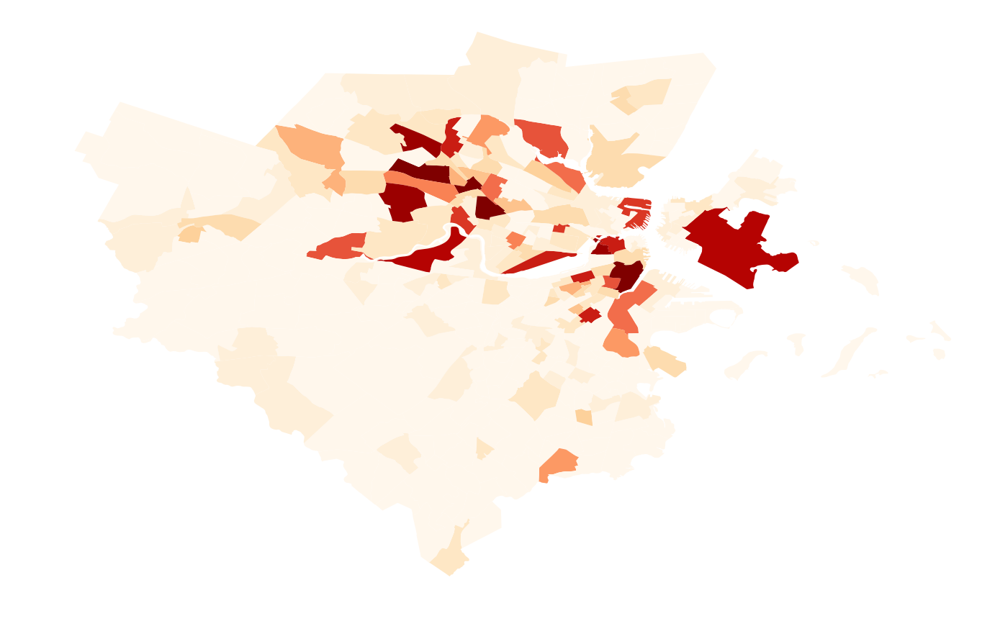

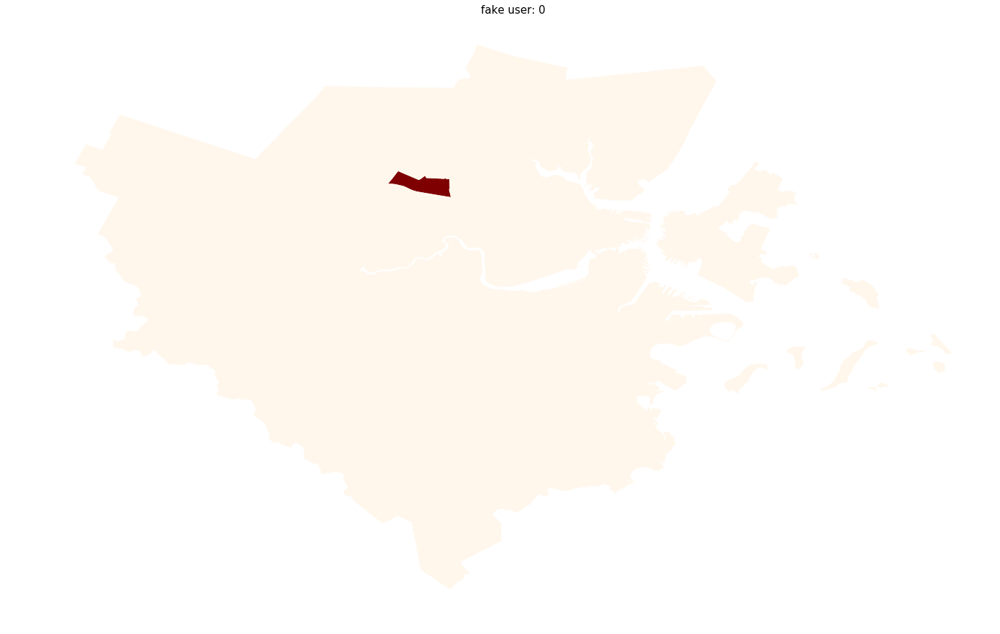

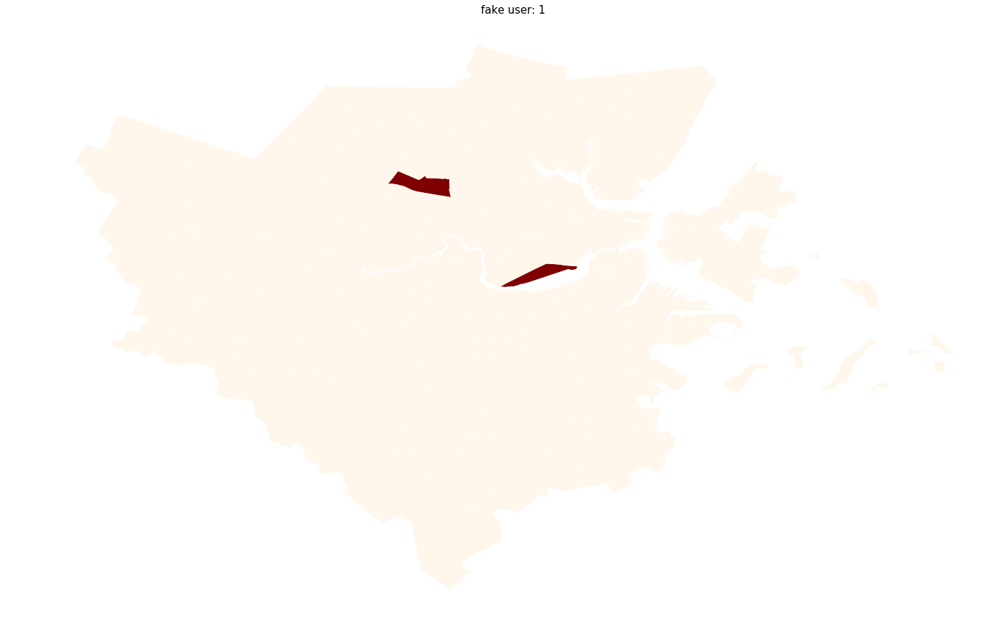

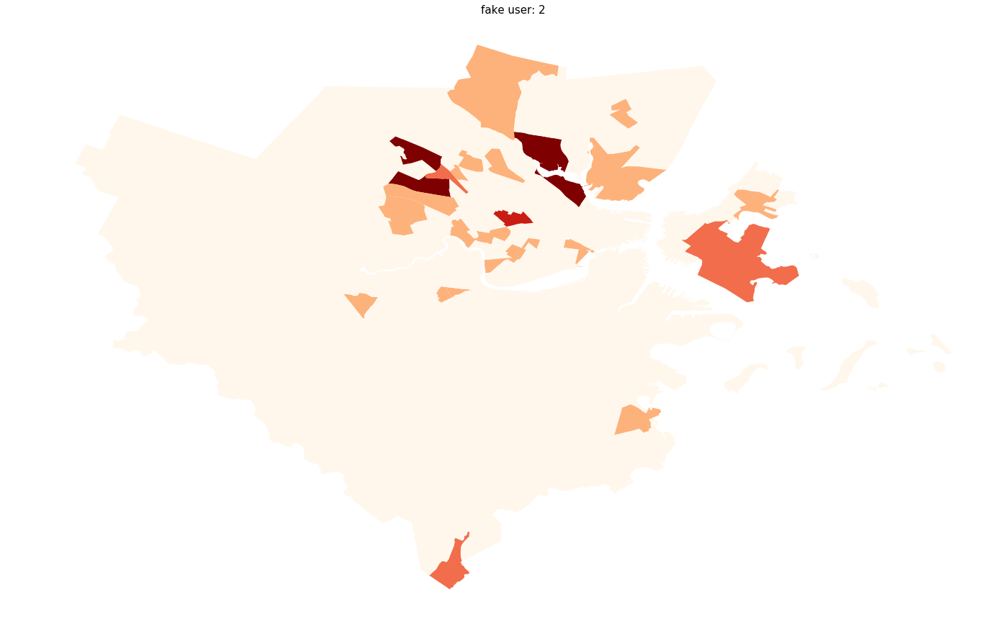

...

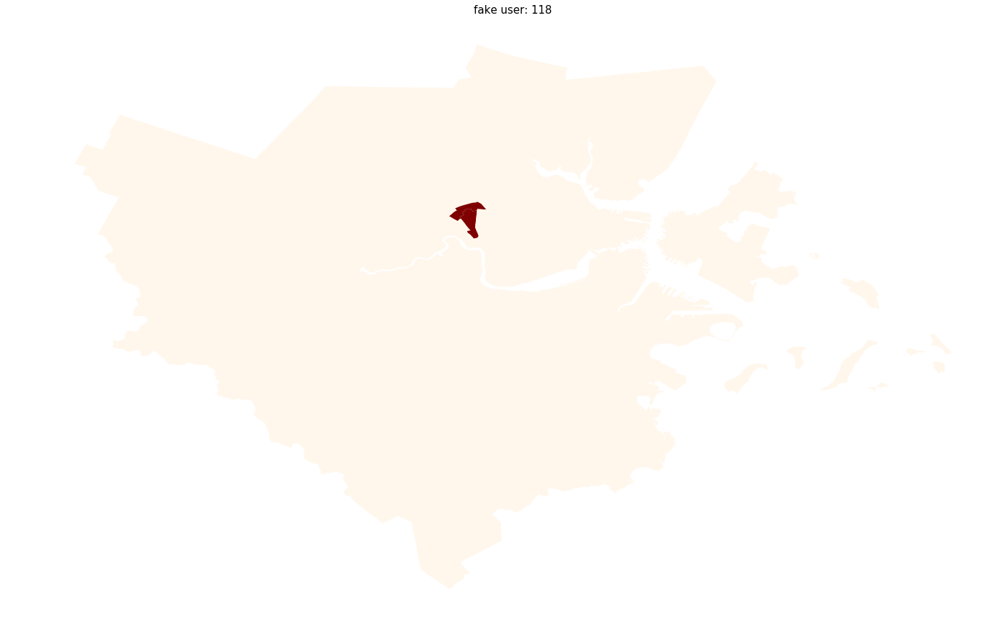

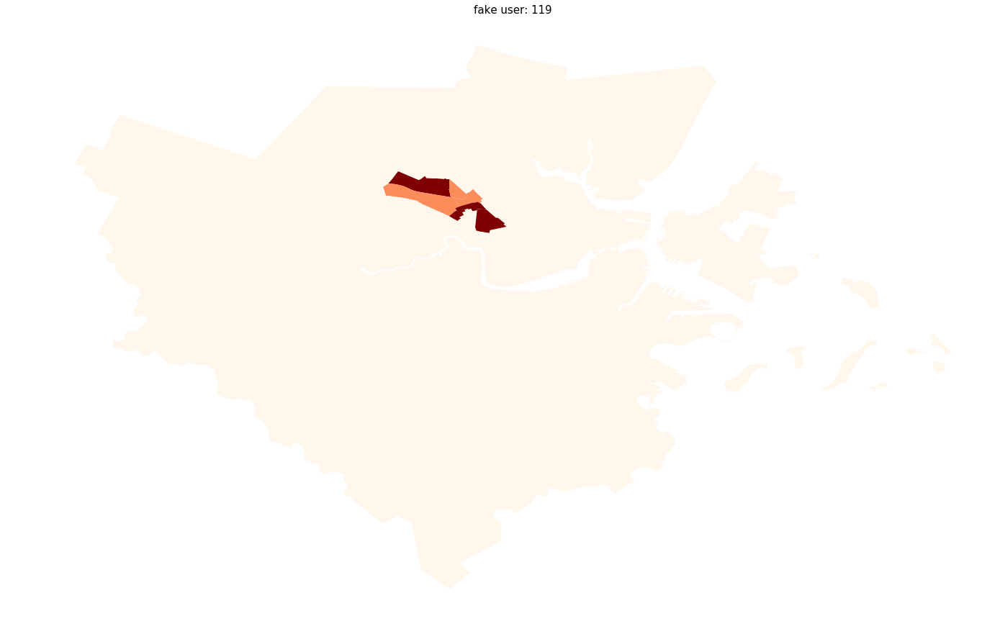

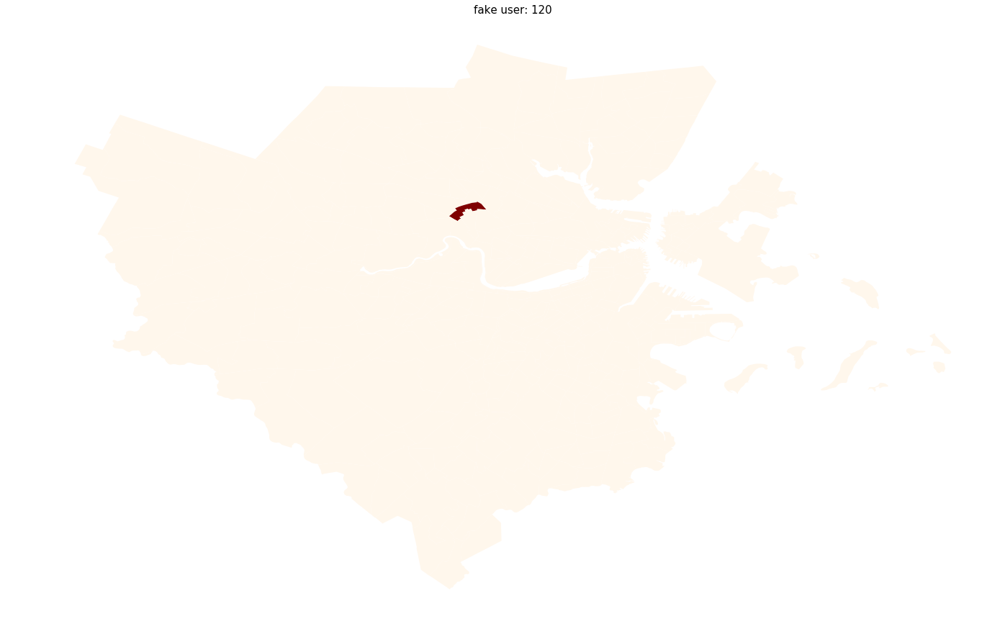

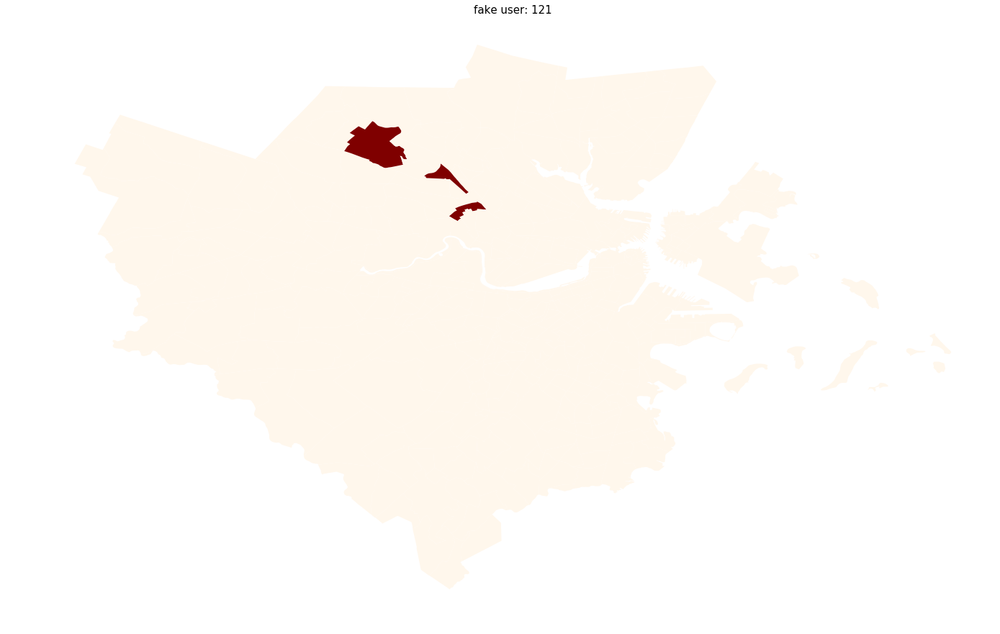

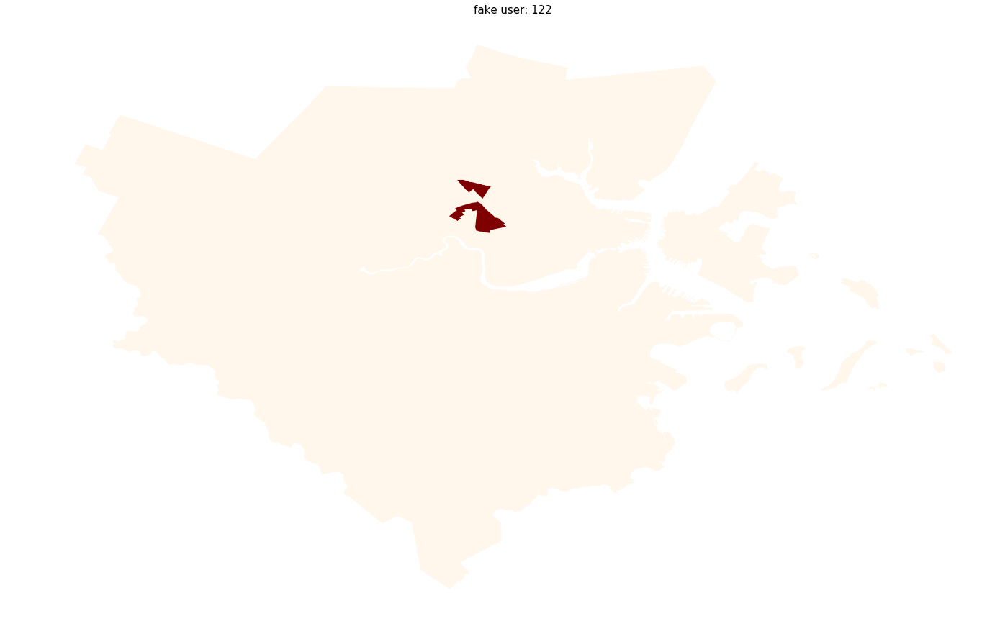

In [84]:
for geoid in census_tracts:
    info = '\nCensus tract %s' % geoid
    tract_shape = our_cities_tracts_shapefile.set_index(TRACT).loc[[geoid]]
    ax = tract_shape.plot(color='#800000')
    ax.axis('off')
    plt.title(info, fontdict={'fontsize': '15', 'fontweight' : '2'})
    # take just the portion of the df for users with homes in this tract
    fake_tract_df = fake_df[fake_df[HOME] == geoid]

    # make aggregate map
    fake_aggregated_dwells_df = geoid_to_aggregate_dwells(fake_tract_df)
    fake_joined_dwell_data_shapefile_for_tract = map_dwells(fake_aggregated_dwells_df, our_cities_tracts_shapefile)

    # make a map for each user (limited count for sake of commiting smaller files to github)
    for user_id in fake_tract_df[USERID].unique()[:12]:
        fake_user_df = geoid_to_user_dwells(fake_tract_df, user_id)
        map_dwells(fake_user_df, our_cities_tracts_shapefile, title='fake user: %s' % user_id)
